In [ ]:
# !pip install pymc

In [ ]:
import pymc as pm
import numpy as np
import pandas as pd
import arviz as az
import pytensor.tensor as pt
from scipy.stats import norm
from scipy.special import logit
import scipy
import time

In [ ]:
def zero_one_beta_logp(y, pi0, pi1, mu, precision):
    alpha = mu * precision
    beta = (1 - mu) * precision
    return pt.switch(pt.eq(y, 0),
                      pt.log(pi0),
                      pt.switch(pt.eq(y, 1),
                                pt.log((1 - pi0) * pi1),
                                pt.log((1 - pi0) * (1 - pi1)) + pm.logp(pm.Beta.dist(alpha=alpha, beta=beta), y)))

In [ ]:
def func(synthetic, building_type):

  theta1_theta2_mu_dict = {"bad": [220, 0.15], "medium": [270, 0.15], "good": [320, 0.15]}
  theta1_theta2_sd_dict = {"bad": [5, 0.015], "medium": [10, 0.03], "good": [10, 0.03]}

  BUILDING_TYPE = building_type

  def inv_logit(x):
      return np.exp(x)/(1 + np.exp(x))


  def phi(x):
      return norm.cdf(x)


  def get_mu_sd(lower_mu, prob_lower_mu, upper_mu, prob_upper_mu, building_type):
      theta1_mu, theta2_mu = theta1_theta2_mu_dict[building_type]

      wind_speed_lower_mu = np.exp(norm.ppf(lower_mu) * theta2_mu + np.log(theta1_mu/norm_factor))
      logit_lower_mu = logit(prob_lower_mu)

      wind_speed_upper_mu = np.exp(norm.ppf(upper_mu) * theta2_mu + np.log(theta1_mu/norm_factor))
      logit_upper_mu = logit(prob_upper_mu)

      coeffs = np.array([[1, wind_speed_lower_mu], [1, wind_speed_upper_mu]])
      mus = np.array([logit_lower_mu, logit_upper_mu])
      thetas = np.linalg.solve(coeffs, mus)
      return thetas[0], thetas[1]

  # Define the wind speed values for simulation
  epsilon = 0.001

  # Read data from the file
  df = pd.read_csv(f"observations_{BUILDING_TYPE}.csv")
  v = df['x'].to_numpy()
  norm_factor = v.max()
  v = np.array(v)/norm_factor

  if synthetic:
    lower_v = 10
    upper_v = 300
    size = 250
    norm_factor = upper_v

    v = np.arange(lower_v, upper_v, step=(upper_v - lower_v)/size)

    v = np.array(v)/norm_factor

  theta_mus = theta1_theta2_mu_dict[building_type]
  theta_sds = theta1_theta2_sd_dict[building_type]
  theta1_mu = theta_mus[0]/norm_factor
  theta2_mu = theta_mus[1]
  theta1_sd = theta_sds[0]/norm_factor
  theta2_sd = theta_sds[1]

  # synthetic data prep
  pi_0_params = get_mu_sd(lower_mu=0.01, prob_lower_mu=0.99, upper_mu=0.05, prob_upper_mu=0.01, building_type=building_type)
  pi_1_params = get_mu_sd(lower_mu=0.95, prob_lower_mu=0.01, upper_mu=0.99, prob_upper_mu=0.99, building_type=building_type)

  # We want theta3, theta4 to be defined in such a way that probability pi_0 is 0.99 when mu_y is 0.01 and 0.01 when the latter 0.05
  # For theta5, theta6, pi_1 is expected to be 0.01 when mu_y is 0.95 and 0.99 when mu_y is 0.99
  # sd is calculated to be 10% of the mean

  # True parameter values
  theta3_mu = pi_0_params[0]
  theta3_sd = abs(pi_0_params[0]/10)

  theta4_mu = pi_0_params[1]
  theta4_sd = abs(pi_0_params[1]/10)

  theta5_mu = pi_1_params[0]
  theta5_sd = abs(pi_1_params[0]/10)

  theta6_mu = pi_1_params[1]
  theta6_sd = abs(pi_1_params[1]/10)

  precision_mu = -100

  if synthetic:
    precision_mu = 50

    y_df = np.zeros_like(v)

    for i in range(len(v)):
      wind_speed = v[i]

      pi0 = inv_logit(theta3_mu + theta4_mu * wind_speed)
      pi1 = inv_logit(theta5_mu + theta6_mu * wind_speed)
      mu_obs = phi(np.log(wind_speed/theta1_mu) * (1/theta2_mu))

      prob_array = np.array([pi0, (1 - pi0) * (1 - pi1), (1 - pi0) * pi1])
      max_prob = np.argmax(prob_array)
      possible_values = np.array([0, np.random.beta(mu_obs * precision_mu, (1-mu_obs) * precision_mu), 1])
      y_df[i] = possible_values[max_prob]
      # y_df[i] = np.random.choice(possible_values, p=prob_array)

  else:
    y_df = df['y'].to_numpy()

  data = pd.DataFrame(v, y_df)
  data.to_csv("synthetic_bad_argmax.csv")

  raise NotImplementedError

  print(f"theta 3: mu = {theta3_mu}, sd = {theta3_sd}")
  print(f"theta 4: mu = {theta4_mu}, sd = {theta4_sd}")
  print(f"theta 5: mu = {theta5_mu}, sd = {theta5_sd}")
  print(f"theta 6: mu = {theta6_mu}, sd = {theta6_sd}")

  st = time.time()

  with pm.Model() as zoib:
      # Priors for unknown model parameters
      theta1 = pm.Normal("theta1", mu=theta1_mu, tau=1/(theta1_sd**2))
      theta2 = pm.Normal("theta2", mu=theta2_mu, tau=1/(theta2_sd**2))
      theta3 = pm.Normal("theta3", mu=theta3_mu, tau=1/(theta3_sd**2))
      theta4 = pm.Normal("theta4", mu=theta4_mu, tau=1/(theta4_sd**2))
      theta5 = pm.Normal("theta5", mu=theta5_mu, tau=1/(theta5_sd**2))
      theta6 = pm.Normal("theta6", mu=theta6_mu, tau=1/(theta6_sd**2))
      if synthetic:
        precision = pm.Uniform("precision", 0, 100)
      else:
        lower_limit = {"bad": 0, "medium": 0, "good": 5}
        upper_limit = {"bad": 10, "medium": 15, "good": 50}
        precision = pm.Uniform("precision", lower_limit[building_type], upper_limit[building_type])


      # Expected value of outcome
      PI_0 = pm.Deterministic("pi 0", pm.math.invlogit(theta3 + theta4 * v))
      PI_1 = pm.Deterministic("pi 1", pm.math.invlogit(theta5 + theta6 * v))
      mu = pm.Deterministic("mu", pm.math.invprobit((1/theta2) * pm.math.log(v/theta1)))

      # Likelihood (sampling distribution) of observations

      y_obs = pm.CustomDist('y_obs', PI_0, PI_1, mu, precision, logp=zero_one_beta_logp, observed=y_df)

      trace = pm.sample(3000, tune=1000, chains=3, cores=4, target_accept=0.99) # tuned samples are being discarded

      az.plot_autocorr(trace, var_names=["theta1", "theta2", "theta3", "theta4", "theta5", "theta6", "precision"])

  et = time.time()

  print(f"Total time elapsed for NUTS sampling: {et - st}")
  print(f"Plotting traces for Building Type: {BUILDING_TYPE}")

  az.plot_trace(data=trace, figsize=(30, 30), var_names=["theta1", "theta2", "theta3", "theta4", "theta5", "theta6", "precision"])
  print(az.summary(trace))
  az.plot_posterior(trace)
  return zoib, trace, y_df

theta 3: mu =  89.98110979628338, sd = 8.998110979628338
theta 4: mu = -162.77275266713784, sd = 16.277275266713783
theta 5: mu = -89.98110979628316, sd = 8.998110979628317
theta 6: mu = 89.71830770392559, sd = 8.97183077039256


Total time elapsed for NUTS sampling: 678.5431251525879
Plotting traces for Building Type: bad
            mean      sd   hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
theta1     0.842   0.011    0.821    0.862      0.000    0.000    4899.0   
theta2     0.202   0.012    0.180    0.226      0.000    0.000    5255.0   
theta3    89.313   8.489   73.428  105.294      0.107    0.076    6279.0   
theta4  -164.457  15.225 -192.532 -135.967      0.183    0.130    7017.0   
theta5    -3.825   1.901   -7.416   -0.290      0.031    0.023    3710.0   
...          ...     ...      ...      ...        ...      ...       ...   
mu[236]    0.583   0.023    0.539    0.624      0.000    0.000    5581.0   
mu[237]    0.583   0.023    0.539    0.624      0.000    0.000    5581.0   
mu[238]    0.583   0.023    0.539    0.624      0.000    0.000    5581.0   
mu[239]    0.583   0.023    0.539    0.624      0.000    0.000    5581.0   
mu[240]    0.583   0.023    0.539    0.624      0.000    0.000    558

/usr/local/lib/python3.10/dist-packages/arviz/plots/plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (730) in plot_posterior, generating only 40 plots
  warnings.warn(


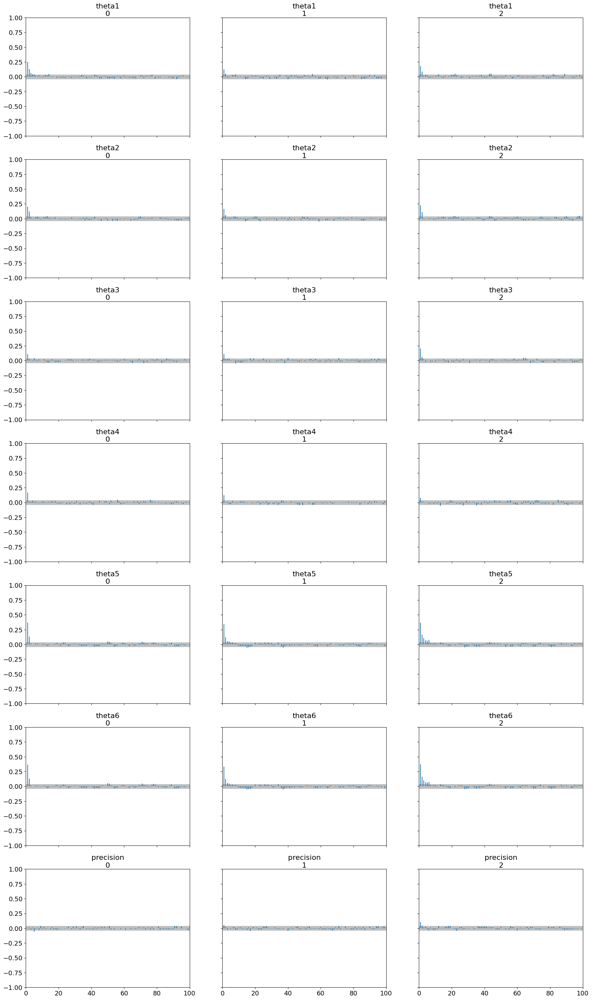

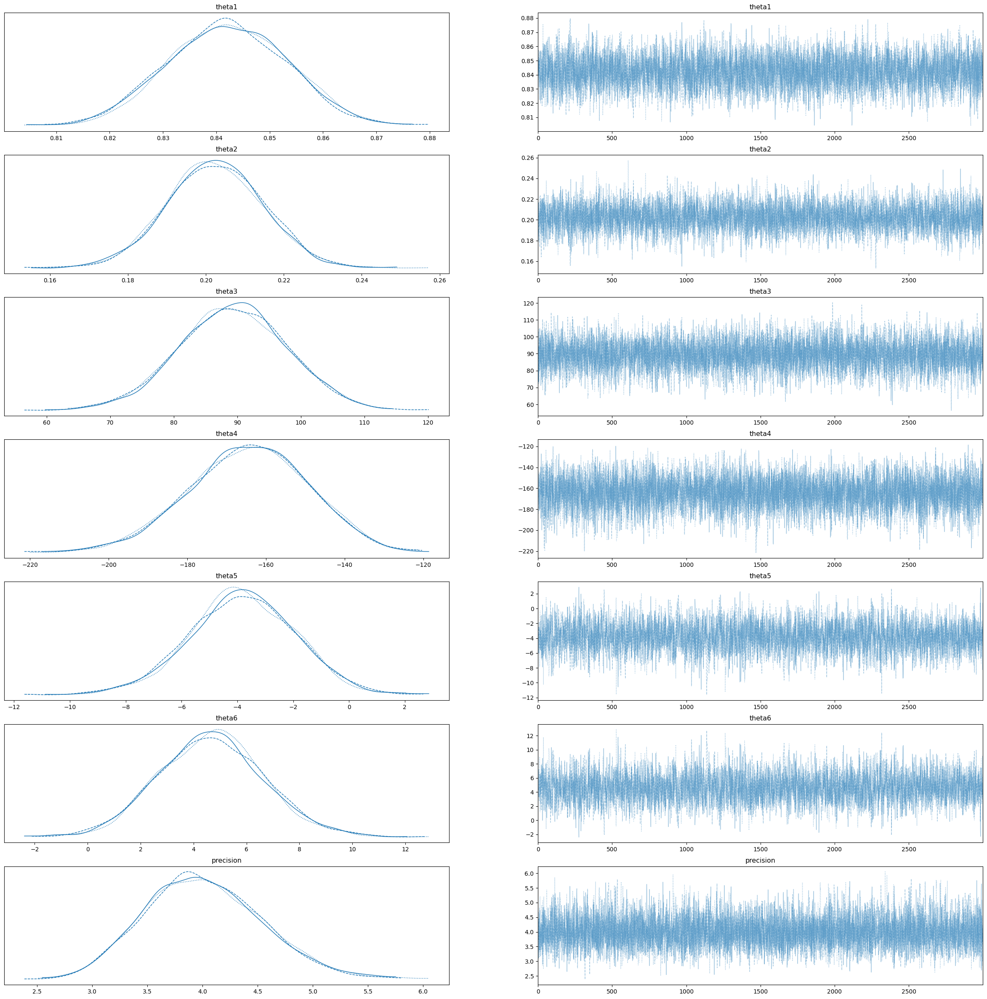

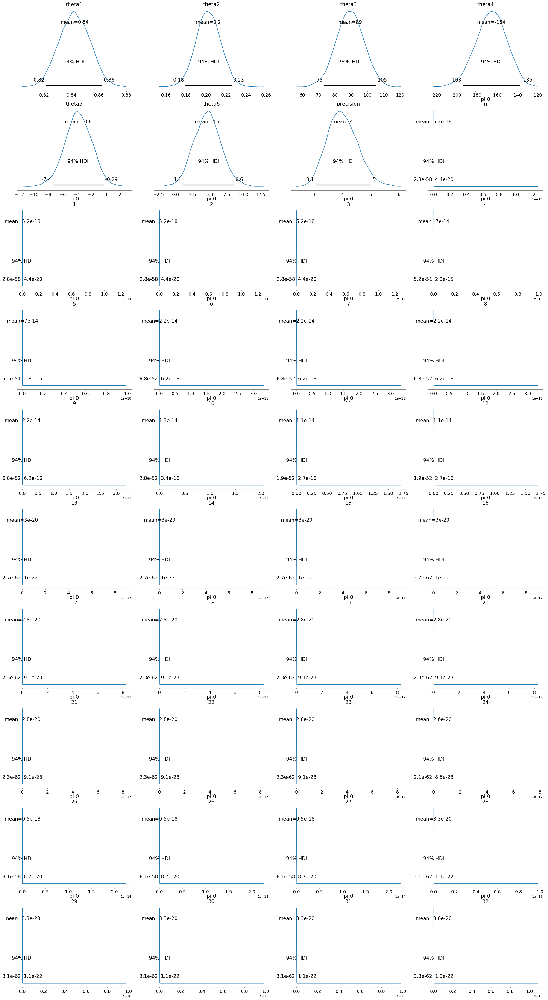

In [ ]:
zoib, trace, y_df = func(False, "bad")

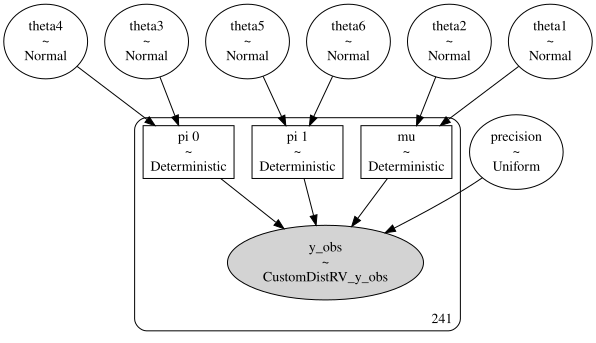

In [ ]:
pm.model_to_graphviz(zoib)

In [ ]:
import os

param_values = pd.DataFrame(az.summary(trace))
param_values.to_csv(os.getcwd() + "/posterior_bad.csv")

In [ ]:
import numpy as np

req_vars = ['theta1', 'theta2', 'theta3', 'theta4', 'theta5', 'theta6', 'precision']

df = pd.DataFrame()

for col in req_vars:
  for chain in range(3):
    df[f"{col}_chain{chain}"] = np.asarray(trace.posterior[col])[chain]


df.to_csv(os.getcwd() + "/trace_bad.csv")

theta 3: mu =  89.98110979628328, sd = 8.998110979628327
theta 4: mu = -165.05671540950826, sd = 16.505671540950825
theta 5: mu = -89.981109796283, sd = 8.998110979628299
theta 6: mu = 90.97719943332525, sd = 9.097719943332525


Total time elapsed for NUTS sampling: 518.0681416988373
Plotting traces for Building Type: bad


/usr/local/lib/python3.10/dist-packages/arviz/stats/diagnostics.py:592: RuntimeWarning: invalid value encountered in double_scalars
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/usr/local/lib/python3.10/dist-packages/arviz/stats/diagnostics.py:984: RuntimeWarning: invalid value encountered in double_scalars
  fac_mcse_sd = np.sqrt(np.exp(1) * (1 - 1 / ess_sd_value) ** (ess_sd_value - 1) - 1)


            mean      sd   hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
theta1     0.730   0.002    0.726    0.734      0.000    0.000    7942.0   
theta2     0.152   0.003    0.146    0.158      0.000    0.000    7530.0   
theta3    86.886   6.299   75.254   98.698      0.087    0.062    5185.0   
theta4  -160.340  11.603 -181.911 -138.680      0.162    0.114    5160.0   
theta5   -90.647   6.391 -102.335  -78.125      0.087    0.062    5383.0   
...          ...     ...      ...      ...        ...      ...       ...   
mu[246]    0.975   0.003    0.970    0.980      0.000    0.000    8102.0   
mu[247]    0.977   0.002    0.972    0.981      0.000    0.000    8094.0   
mu[248]    0.978   0.002    0.974    0.982      0.000    0.000    8087.0   
mu[249]    0.980   0.002    0.975    0.984      0.000    0.000    8080.0   
mu[250]    0.981   0.002    0.976    0.985      0.000    0.000    8072.0   

         ess_tail  r_hat  
theta1     5550.0    1.0  
theta2     5268.0    1.0  
theta3

/usr/local/lib/python3.10/dist-packages/arviz/plots/plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (760) in plot_posterior, generating only 40 plots
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/arviz/stats/density_utils.py:487: UserWarning: Your data appears to have a single value or no finite values
  warnings.warn("Your data appears to have a single value or no finite values")


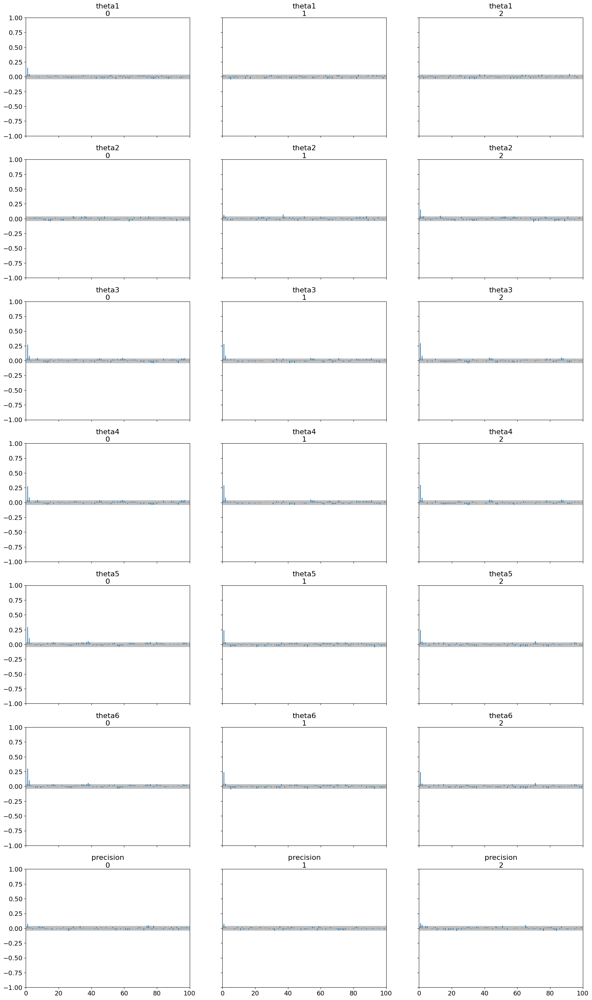

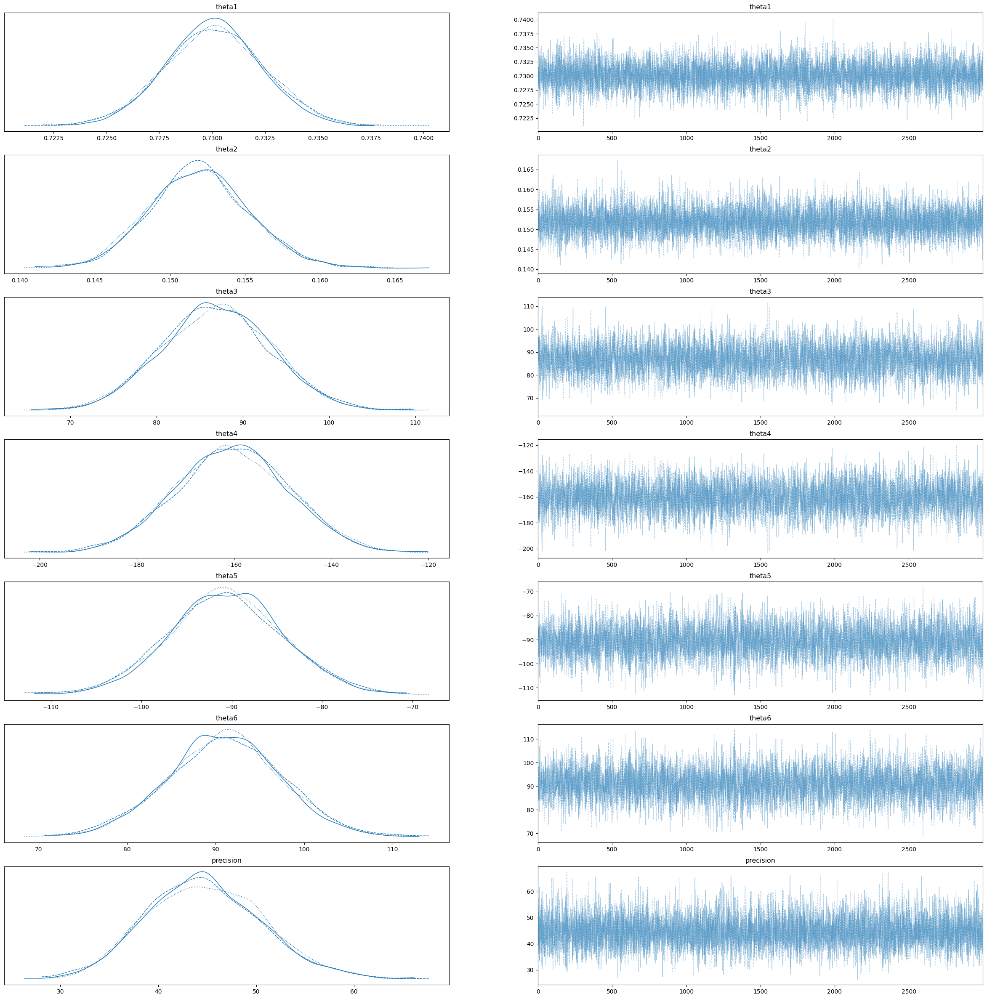

ValueError: ignored

<Figure size 2944x5520 with 40 Axes>

In [ ]:
zoib_syn, trace_syn, y_df_syn = func(True, "bad")

In [ ]:
import os

param_values = pd.DataFrame(az.summary(trace_syn))
param_values.to_csv(os.getcwd() + "/posterior_syn_bad.csv")

/usr/local/lib/python3.10/dist-packages/arviz/stats/diagnostics.py:592: RuntimeWarning: invalid value encountered in double_scalars
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/usr/local/lib/python3.10/dist-packages/arviz/stats/diagnostics.py:984: RuntimeWarning: invalid value encountered in double_scalars
  fac_mcse_sd = np.sqrt(np.exp(1) * (1 - 1 / ess_sd_value) ** (ess_sd_value - 1) - 1)


In [ ]:
import numpy as np

req_vars = ['theta1', 'theta2', 'theta3', 'theta4', 'theta5', 'theta6', 'precision']

df = pd.DataFrame()

for col in req_vars:
  for chain in range(3):
    df[f"{col}_chain{chain}"] = np.asarray(trace_syn.posterior[col])[chain]


df.to_csv(os.getcwd() + "/trace_syn_bad.csv")

theta 3: mu =  89.98110979628325, sd = 8.998110979628326
theta 4: mu = -132.68671900734452, sd = 13.268671900734452
theta 5: mu = -89.98110979628309, sd = 8.99811097962831
theta 6: mu = 73.13526182400575, sd = 7.313526182400575


Total time elapsed for NUTS sampling: 671.086847782135
Plotting traces for Building Type: medium
           mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
theta1    1.079  0.014   1.053    1.105      0.000    0.000    6293.0   
theta2    0.344  0.016   0.313    0.374      0.000    0.000    6173.0   
theta3   16.058  3.862   9.258   23.581      0.058    0.043    4521.0   
theta4  -26.381  5.598 -37.250  -16.405      0.085    0.062    4517.0   
theta5  -28.760  4.698 -37.506  -20.035      0.068    0.048    4795.0   
...         ...    ...     ...      ...        ...      ...       ...   
mu[382]   0.278  0.011   0.257    0.299      0.000    0.000    8874.0   
mu[383]   0.278  0.011   0.257    0.299      0.000    0.000    8874.0   
mu[384]   0.278  0.011   0.257    0.299      0.000    0.000    8874.0   
mu[385]   0.278  0.011   0.257    0.299      0.000    0.000    8874.0   
mu[386]   0.278  0.011   0.257    0.299      0.000    0.000    8874.0   

         ess_tail  r_hat  

/usr/local/lib/python3.10/dist-packages/arviz/plots/plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (1168) in plot_posterior, generating only 40 plots
  warnings.warn(


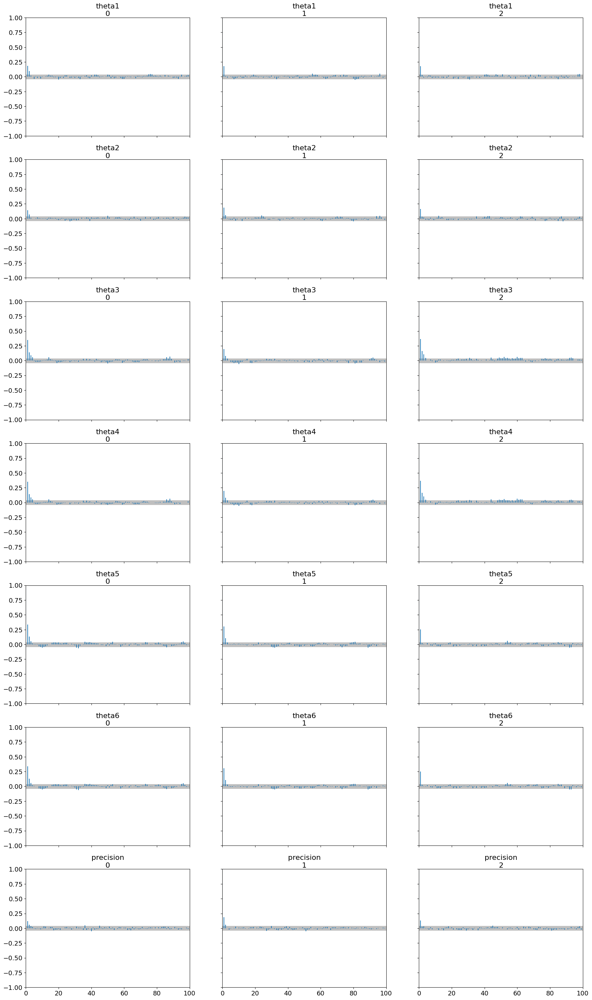

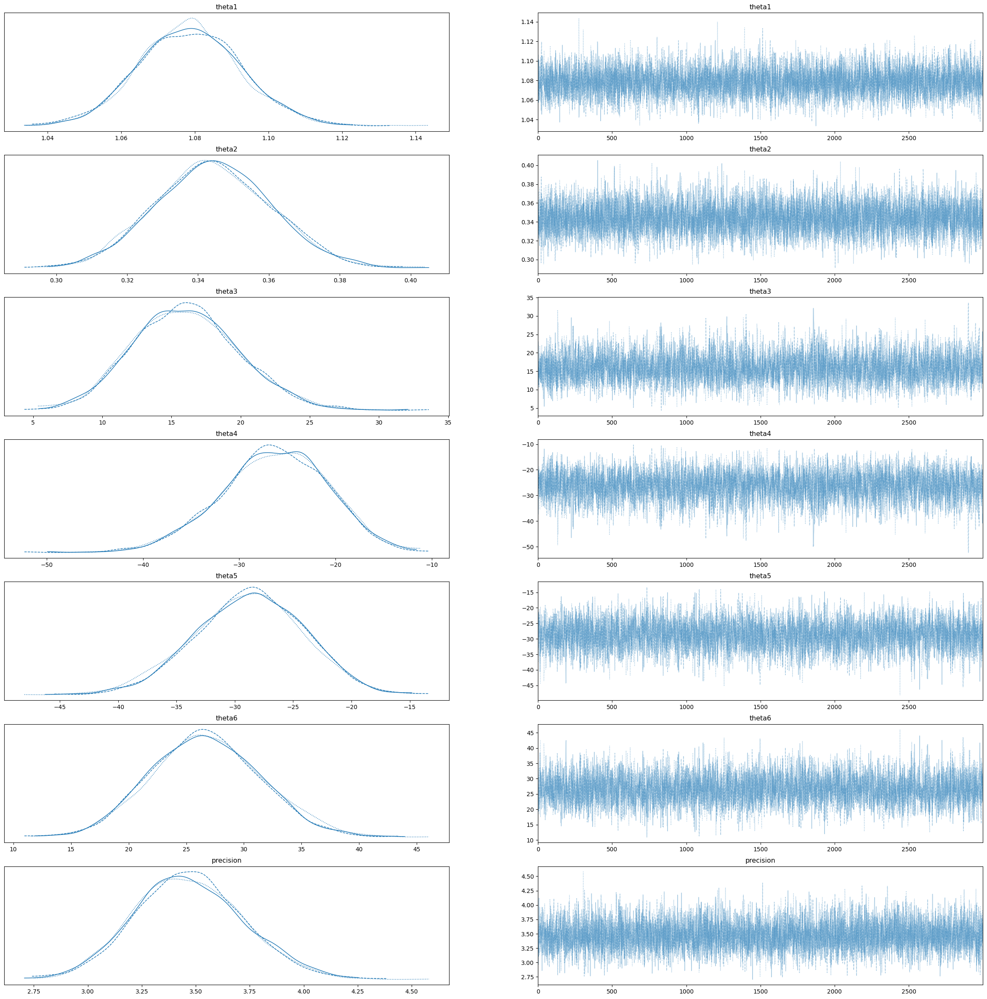

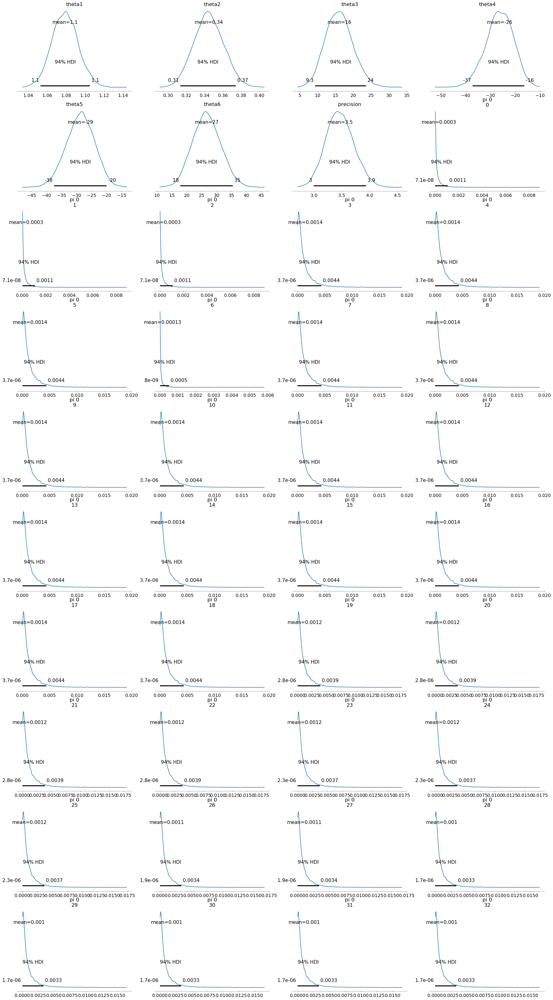

In [ ]:
zoib_medium, trace_medium, y_df_medium = func(False, "medium")

In [ ]:
import os

param_values = pd.DataFrame(az.summary(trace_medium))
param_values.to_csv(os.getcwd() + "/posterior_medium.csv")

In [ ]:
import numpy as np

req_vars = ['theta1', 'theta2', 'theta3', 'theta4', 'theta5', 'theta6', 'precision']

df = pd.DataFrame()

for col in req_vars:
  for chain in range(3):
    df[f"{col}_chain{chain}"] = np.asarray(trace_medium.posterior[col])[chain]


df.to_csv(os.getcwd() + "/trace_medium.csv")

theta 3: mu = 89.98110979628333, sd = 8.998110979628333
theta 4: mu = -111.9062673483995, sd = 11.190626734839949
theta 5: mu = -89.9811097962832, sd = 8.99811097962832
theta 6: mu = 61.681336485676184, sd = 6.168133648567618


Total time elapsed for NUTS sampling: 584.9262444972992
Plotting traces for Building Type: good
          mean     sd   hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
theta1   1.210  0.022    1.170    1.251      0.000    0.000    4887.0   
theta2   0.248  0.013    0.223    0.273      0.000    0.000    5759.0   
theta3  53.608  5.909   43.169   65.482      0.088    0.063    4473.0   
theta4 -72.237  7.835  -87.328  -57.932      0.117    0.083    4459.0   
theta5 -90.054  8.854 -106.245  -73.318      0.095    0.068    8588.0   
...        ...    ...      ...      ...        ...      ...       ...   
mu[94]   0.088  0.011    0.068    0.109      0.000    0.000    6307.0   
mu[95]   0.088  0.011    0.068    0.109      0.000    0.000    6307.0   
mu[96]   0.088  0.011    0.068    0.109      0.000    0.000    6307.0   
mu[97]   0.088  0.011    0.068    0.109      0.000    0.000    6307.0   
mu[98]   0.088  0.011    0.068    0.109      0.000    0.000    6307.0   

        ess_tail  r_hat  
t

/usr/local/lib/python3.10/dist-packages/arviz/plots/plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (304) in plot_posterior, generating only 40 plots
  warnings.warn(


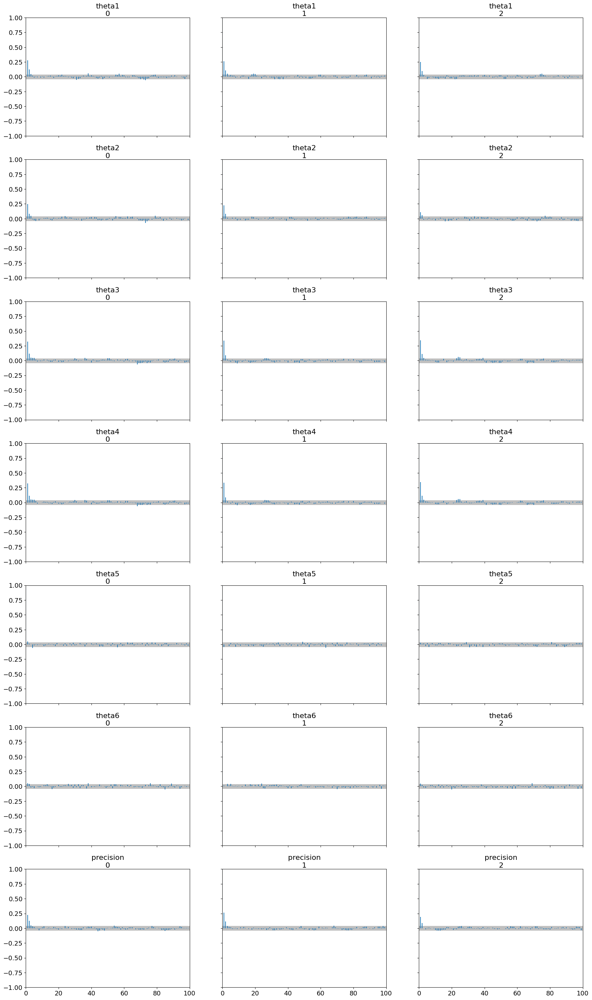

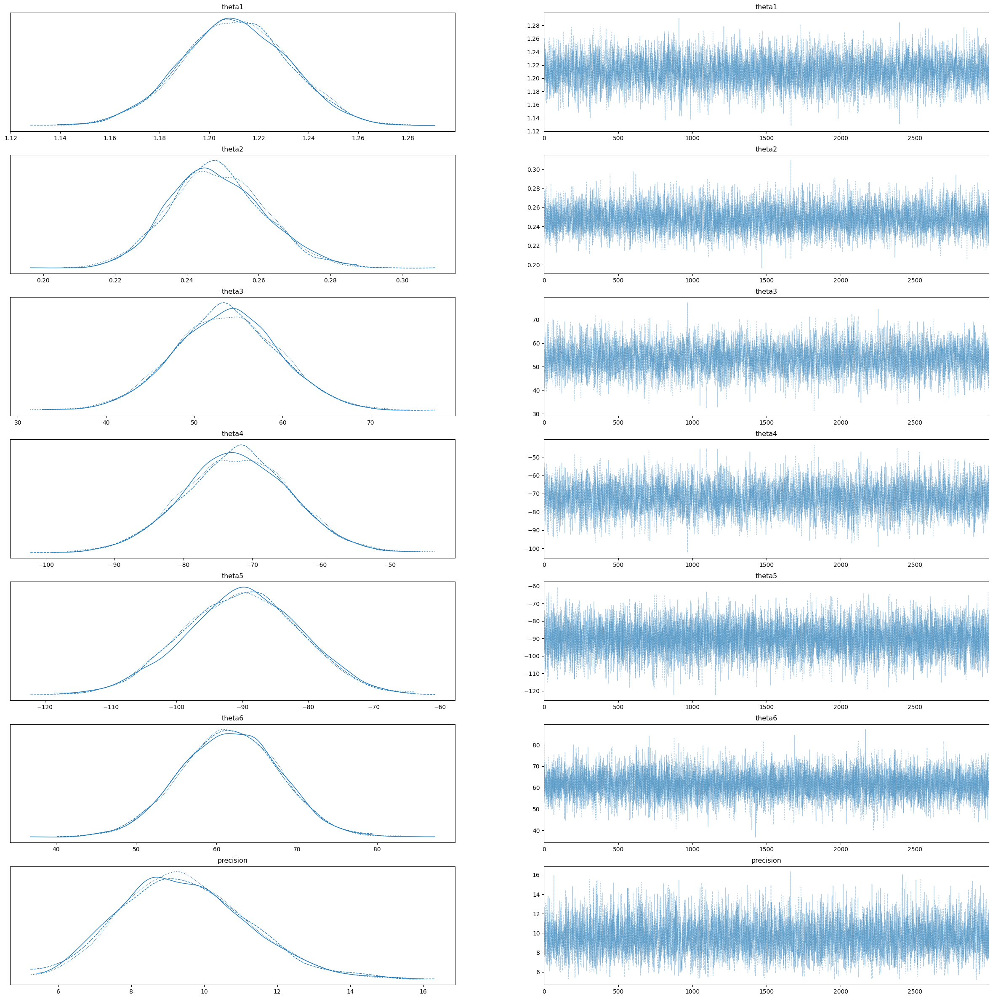

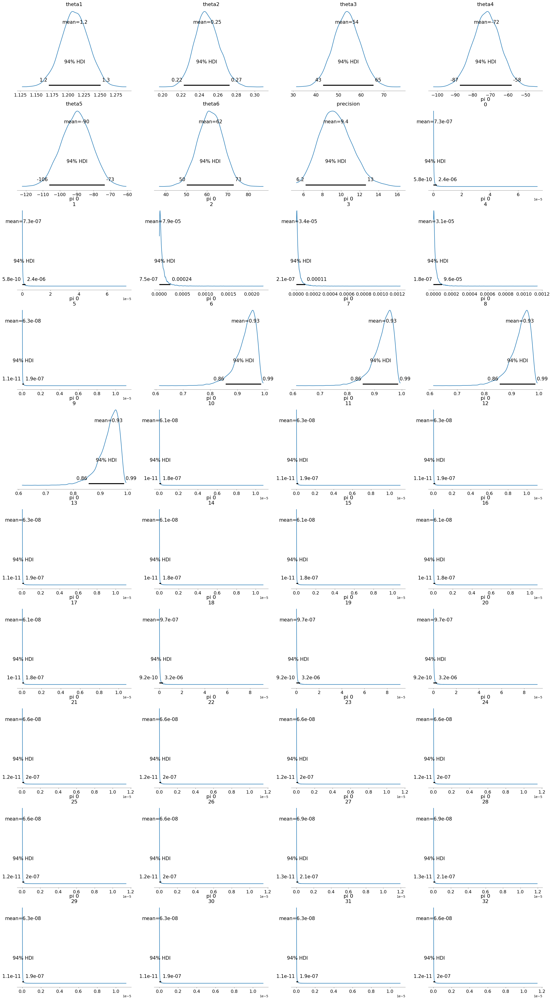

In [ ]:
zoib_good, trace_good, y_df_good = func(False, "good")

In [ ]:
import os

param_values = pd.DataFrame(az.summary(trace_good))
param_values.to_csv(os.getcwd() + "/posterior_good.csv")

In [ ]:
import numpy as np

req_vars = ['theta1', 'theta2', 'theta3', 'theta4', 'theta5', 'theta6', 'precision']

df = pd.DataFrame()

for col in req_vars:
  for chain in range(3):
    df[f"{col}_chain{chain}"] = np.asarray(trace_good.posterior[col])[chain]


df.to_csv(os.getcwd() + "/trace_good.csv")